<a href="https://colab.research.google.com/github/andygma567/Portfolio-Project-4-Lightning-Experiment/blob/main/Write_up_of_Lightning_Experiment.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Abstract

This is an example of using PyTorch Lightning to implement a FreezeD type of transfer learning ([ArXiv link](https://arxiv.org/abs/2002.10964)). 

We start by closely following a notebook provided by ([link the GAN course](https://www.coursera.org/learn/build-better-generative-adversarial-networks-gans?specialization=generative-adversarial-networks-gans#syllabus)) ([link to colab notebook](https://colab.research.google.com/github/https-deeplearning-ai/GANs-Public/blob/master/C2W3_FreezeD_(Optional).ipynb)) from Coursera and we implement the same features in PyTorch Lightning (PL). Key differences between this implementation and the original notebook are the following:

- We use PL to make the training loop
- We use PL to manage the use of GPU devices and we acces the GPU devices by using self.device from inside the pl.module
- We moved all the of the checkpointing and displaying / logging metrics into a custom PL callback 
- We use a prebuilt PyTorch learning rate scheduler to adjust the generator's optimizer's learning rate and we optimize all of the generator's parameters instead of coding a custom scheduler for just one part of the style generator 
- It's important to note that this PL implementation has a step count that increments by two because the PL makes two calls to the training_step method in each pass of the training for-loop

While this project was able to run, it did not result in accurate anime faces. Improvements could be made to the set of up of this GAN (please see further work section below) and this model could benefit from training for a longer amount of time. 

This model was only trained for roughly 5% of the total training time that was done in the original notebook. 

In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Tue Oct  4 23:30:19 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   53C    P8     9W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
!pip install -q pytorch-lightning

     |████████████████████████████████| 708 kB 30.3 MB/s 
     |████████████████████████████████| 5.9 MB 52.1 MB/s 
     |████████████████████████████████| 529 kB 70.1 MB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.8.2+zzzcolab20220719082949 requires tensorboard<2.9,>=2.8, but you have tensorboard 2.10.1 which is incompatible.


In [ ]:
import os
import pathlib
import torch 
from torch.autograd import grad
import torch.nn as nn
import torch.nn.functional as F
from torch.optim.lr_scheduler import ExponentialLR
import matplotlib.pyplot as plt
from torchvision.utils import make_grid
import torchvision.transforms as transforms
from PIL import Image
import numpy as np
from torchvision.transforms import ToTensor # used in the custom dataset class
import pytorch_lightning as pl


# Get the Data

The model is trained on an anime faces dataset stored on my Google Drive. I can't be sure of where I originally found this dataset but I think it was from [this](https://www.kaggle.com/datasets/splcher/animefacedataset) dataset on Kaggle

In [ ]:
if not pathlib.Path('size64').exists():
  !cp '/content/drive/MyDrive/anime-faces.zip' .
  !unzip -q "/content/anime-faces.zip"
else:
  print('File already exists in cwd')


This is a custom Datatset class taken from the original FreezeD notebook. Originally this class was written for dealing with multiple classes of images but in this experiment we will only use one class of images. 

In [ ]:
class Dataset(torch.utils.data.Dataset):

    def __init__(self, root, n_classes=10, resolution=256):
        super().__init__()

        self.n_classes = n_classes

        # List of paths to training examples
        self.examples = []
        self.load_examples_from_dir(root)

        # Initialize transforms
        self.transforms = transforms.Compose([
            transforms.Resize((resolution, resolution), Image.LANCZOS),
            transforms.RandomHorizontalFlip(),
            transforms.Lambda(lambda x: np.array(x)),
            transforms.ToTensor(),
            transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
        ])

    def load_examples_from_dir(self, abs_path):
        '''
        Given a folder of examples, this function returns a list of paired examples.
        '''
        assert os.path.isdir(abs_path)

        img_suffix = '.png'

        n_classes = 0
        for root, _, files in os.walk(abs_path):
            if n_classes == self.n_classes:
                break
            for f in files:
                if f.endswith(img_suffix):
                    self.examples.append(root + '/' + f)
            n_classes += 1

    def __getitem__(self, idx):
        example = self.examples[idx]
        img = Image.open(example).convert('RGB')
        return self.transforms(img)

    def __len__(self):
        return len(self.examples)

# The StyleGAN Model

This style GAN model is taken from [this](https://github.com/rosinality/style-based-gan-pytorch) Github repository. 

In [ ]:
#@title Code (double click to view) { form-width: "200px", display-mode: "code" }

''' Taken from https://github.com/rosinality/style-based-gan-pytorch/blob/master/model.py '''
# MIT License
#
# Copyright (c) 2019 Kim Seonghyeon
#
# Permission is hereby granted, free of charge, to any person obtaining a copy
# of this software and associated documentation files (the "Software"), to deal
# in the Software without restriction, including without limitation the rights
# to use, copy, modify, merge, publish, distribute, sublicense, and/or sell
# copies of the Software, and to permit persons to whom the Software is
# furnished to do so, subject to the following conditions:
#
# The above copyright notice and this permission notice shall be included in all
# copies or substantial portions of the Software.
#
# THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
# IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
# FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE
# AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
# LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM,
# OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE
# SOFTWARE.

from torch.nn import init
from torch.autograd import Function

from math import sqrt

import random


def init_linear(linear):
    init.xavier_normal(linear.weight)
    linear.bias.data.zero_()


def init_conv(conv, glu=True):
    init.kaiming_normal(conv.weight)
    if conv.bias is not None:
        conv.bias.data.zero_()


class EqualLR:
    def __init__(self, name):
        self.name = name

    def compute_weight(self, module):
        weight = getattr(module, self.name + '_orig')
        fan_in = weight.data.size(1) * weight.data[0][0].numel()

        return weight * sqrt(2 / fan_in)

    @staticmethod
    def apply(module, name):
        fn = EqualLR(name)

        weight = getattr(module, name)
        del module._parameters[name]
        module.register_parameter(name + '_orig', nn.Parameter(weight.data))
        module.register_forward_pre_hook(fn)

        return fn

    def __call__(self, module, input):
        weight = self.compute_weight(module)
        setattr(module, self.name, weight)


def equal_lr(module, name='weight'):
    EqualLR.apply(module, name)

    return module


class FusedUpsample(nn.Module):
    def __init__(self, in_channel, out_channel, kernel_size, padding=0):
        super().__init__()

        weight = torch.randn(in_channel, out_channel, kernel_size, kernel_size)
        bias = torch.zeros(out_channel)

        fan_in = in_channel * kernel_size * kernel_size
        self.multiplier = sqrt(2 / fan_in)

        self.weight = nn.Parameter(weight)
        self.bias = nn.Parameter(bias)

        self.pad = padding

    def forward(self, input):
        weight = F.pad(self.weight * self.multiplier, [1, 1, 1, 1])
        weight = (
            weight[:, :, 1:, 1:]
            + weight[:, :, :-1, 1:]
            + weight[:, :, 1:, :-1]
            + weight[:, :, :-1, :-1]
        ) / 4

        out = F.conv_transpose2d(input, weight, self.bias, stride=2, padding=self.pad)

        return out


class FusedDownsample(nn.Module):
    def __init__(self, in_channel, out_channel, kernel_size, padding=0):
        super().__init__()

        weight = torch.randn(out_channel, in_channel, kernel_size, kernel_size)
        bias = torch.zeros(out_channel)

        fan_in = in_channel * kernel_size * kernel_size
        self.multiplier = sqrt(2 / fan_in)

        self.weight = nn.Parameter(weight)
        self.bias = nn.Parameter(bias)

        self.pad = padding

    def forward(self, input):
        weight = F.pad(self.weight * self.multiplier, [1, 1, 1, 1])
        weight = (
            weight[:, :, 1:, 1:]
            + weight[:, :, :-1, 1:]
            + weight[:, :, 1:, :-1]
            + weight[:, :, :-1, :-1]
        ) / 4

        out = F.conv2d(input, weight, self.bias, stride=2, padding=self.pad)

        return out


class PixelNorm(nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, input):
        return input / torch.sqrt(torch.mean(input ** 2, dim=1, keepdim=True) + 1e-8)


class BlurFunctionBackward(Function):
    @staticmethod
    def forward(ctx, grad_output, kernel, kernel_flip):
        ctx.save_for_backward(kernel, kernel_flip)

        grad_input = F.conv2d(
            grad_output, kernel_flip, padding=1, groups=grad_output.shape[1]
        )

        return grad_input

    @staticmethod
    def backward(ctx, gradgrad_output):
        kernel, kernel_flip = ctx.saved_tensors

        grad_input = F.conv2d(
            gradgrad_output, kernel, padding=1, groups=gradgrad_output.shape[1]
        )

        return grad_input, None, None


class BlurFunction(Function):
    @staticmethod
    def forward(ctx, input, kernel, kernel_flip):
        ctx.save_for_backward(kernel, kernel_flip)

        output = F.conv2d(input, kernel, padding=1, groups=input.shape[1])

        return output

    @staticmethod
    def backward(ctx, grad_output):
        kernel, kernel_flip = ctx.saved_tensors

        grad_input = BlurFunctionBackward.apply(grad_output, kernel, kernel_flip)

        return grad_input, None, None


blur = BlurFunction.apply


class Blur(nn.Module):
    def __init__(self, channel):
        super().__init__()

        weight = torch.tensor([[1, 2, 1], [2, 4, 2], [1, 2, 1]], dtype=torch.float32)
        weight = weight.view(1, 1, 3, 3)
        weight = weight / weight.sum()
        weight_flip = torch.flip(weight, [2, 3])

        self.register_buffer('weight', weight.repeat(channel, 1, 1, 1))
        self.register_buffer('weight_flip', weight_flip.repeat(channel, 1, 1, 1))

    def forward(self, input):
        return blur(input, self.weight, self.weight_flip)
        # return F.conv2d(input, self.weight, padding=1, groups=input.shape[1])


class EqualConv2d(nn.Module):
    def __init__(self, *args, **kwargs):
        super().__init__()

        conv = nn.Conv2d(*args, **kwargs)
        conv.weight.data.normal_()
        conv.bias.data.zero_()
        self.conv = equal_lr(conv)

    def forward(self, input):
        return self.conv(input)


class EqualLinear(nn.Module):
    def __init__(self, in_dim, out_dim):
        super().__init__()

        linear = nn.Linear(in_dim, out_dim)
        linear.weight.data.normal_()
        linear.bias.data.zero_()

        self.linear = equal_lr(linear)

    def forward(self, input):
        return self.linear(input)


class ConvBlock(nn.Module):
    def __init__(
        self,
        in_channel,
        out_channel,
        kernel_size,
        padding,
        kernel_size2=None,
        padding2=None,
        downsample=False,
        fused=False,
    ):
        super().__init__()

        pad1 = padding
        pad2 = padding
        if padding2 is not None:
            pad2 = padding2

        kernel1 = kernel_size
        kernel2 = kernel_size
        if kernel_size2 is not None:
            kernel2 = kernel_size2

        self.conv1 = nn.Sequential(
            EqualConv2d(in_channel, out_channel, kernel1, padding=pad1),
            nn.LeakyReLU(0.2),
        )

        if downsample:
            if fused:
                self.conv2 = nn.Sequential(
                    Blur(out_channel),
                    FusedDownsample(out_channel, out_channel, kernel2, padding=pad2),
                    nn.LeakyReLU(0.2),
                )

            else:
                self.conv2 = nn.Sequential(
                    Blur(out_channel),
                    EqualConv2d(out_channel, out_channel, kernel2, padding=pad2),
                    nn.AvgPool2d(2),
                    nn.LeakyReLU(0.2),
                )

        else:
            self.conv2 = nn.Sequential(
                EqualConv2d(out_channel, out_channel, kernel2, padding=pad2),
                nn.LeakyReLU(0.2),
            )

    def forward(self, input):
        out = self.conv1(input)
        out = self.conv2(out)

        return out


class AdaptiveInstanceNorm(nn.Module):
    def __init__(self, in_channel, style_dim):
        super().__init__()

        self.norm = nn.InstanceNorm2d(in_channel)
        self.style = EqualLinear(style_dim, in_channel * 2)

        self.style.linear.bias.data[:in_channel] = 1
        self.style.linear.bias.data[in_channel:] = 0

    def forward(self, input, style):
        style = self.style(style).unsqueeze(2).unsqueeze(3)
        gamma, beta = style.chunk(2, 1)

        out = self.norm(input)
        out = gamma * out + beta

        return out


class NoiseInjection(nn.Module):
    def __init__(self, channel):
        super().__init__()

        self.weight = nn.Parameter(torch.zeros(1, channel, 1, 1))

    def forward(self, image, noise):
        return image + self.weight * noise


class ConstantInput(nn.Module):
    def __init__(self, channel, size=4):
        super().__init__()

        self.input = nn.Parameter(torch.randn(1, channel, size, size))

    def forward(self, input):
        batch = input.shape[0]
        out = self.input.repeat(batch, 1, 1, 1)

        return out


class StyledConvBlock(nn.Module):
    def __init__(
        self,
        in_channel,
        out_channel,
        kernel_size=3,
        padding=1,
        style_dim=512,
        initial=False,
        upsample=False,
        fused=False,
    ):
        super().__init__()

        if initial:
            self.conv1 = ConstantInput(in_channel)

        else:
            if upsample:
                if fused:
                    self.conv1 = nn.Sequential(
                        FusedUpsample(
                            in_channel, out_channel, kernel_size, padding=padding
                        ),
                        Blur(out_channel),
                    )

                else:
                    self.conv1 = nn.Sequential(
                        nn.Upsample(scale_factor=2, mode='nearest'),
                        EqualConv2d(
                            in_channel, out_channel, kernel_size, padding=padding
                        ),
                        Blur(out_channel),
                    )

            else:
                self.conv1 = EqualConv2d(
                    in_channel, out_channel, kernel_size, padding=padding
                )

        self.noise1 = equal_lr(NoiseInjection(out_channel))
        self.adain1 = AdaptiveInstanceNorm(out_channel, style_dim)
        self.lrelu1 = nn.LeakyReLU(0.2)

        self.conv2 = EqualConv2d(out_channel, out_channel, kernel_size, padding=padding)
        self.noise2 = equal_lr(NoiseInjection(out_channel))
        self.adain2 = AdaptiveInstanceNorm(out_channel, style_dim)
        self.lrelu2 = nn.LeakyReLU(0.2)

    def forward(self, input, style, noise):
        out = self.conv1(input)
        out = self.noise1(out, noise)
        out = self.lrelu1(out)
        out = self.adain1(out, style)

        out = self.conv2(out)
        out = self.noise2(out, noise)
        out = self.lrelu2(out)
        out = self.adain2(out, style)

        return out


class Generator(nn.Module):
    def __init__(self, code_dim, fused=True):
        super().__init__()

        self.progression = nn.ModuleList(
            [
                StyledConvBlock(512, 512, 3, 1, initial=True),  # 4
                StyledConvBlock(512, 512, 3, 1, upsample=True),  # 8
                StyledConvBlock(512, 512, 3, 1, upsample=True),  # 16
                StyledConvBlock(512, 512, 3, 1, upsample=True),  # 32
                StyledConvBlock(512, 256, 3, 1, upsample=True),  # 64
                StyledConvBlock(256, 128, 3, 1, upsample=True, fused=fused),  # 128
                StyledConvBlock(128, 64, 3, 1, upsample=True, fused=fused),  # 256
                StyledConvBlock(64, 32, 3, 1, upsample=True, fused=fused),  # 512
                StyledConvBlock(32, 16, 3, 1, upsample=True, fused=fused),  # 1024
            ]
        )

        self.to_rgb = nn.ModuleList(
            [
                EqualConv2d(512, 3, 1),
                EqualConv2d(512, 3, 1),
                EqualConv2d(512, 3, 1),
                EqualConv2d(512, 3, 1),
                EqualConv2d(256, 3, 1),
                EqualConv2d(128, 3, 1),
                EqualConv2d(64, 3, 1),
                EqualConv2d(32, 3, 1),
                EqualConv2d(16, 3, 1),
            ]
        )

        # self.blur = Blur()

    def forward(self, style, noise, step=0, alpha=-1, mixing_range=(-1, -1)):
        out = noise[0]

        if len(style) < 2:
            inject_index = [len(self.progression) + 1]

        else:
            inject_index = sorted(random.sample(list(range(step)), len(style) - 1))

        crossover = 0

        for i, (conv, to_rgb) in enumerate(zip(self.progression, self.to_rgb)):
            if mixing_range == (-1, -1):
                if crossover < len(inject_index) and i > inject_index[crossover]:
                    crossover = min(crossover + 1, len(style))

                style_step = style[crossover]

            else:
                if mixing_range[0] <= i <= mixing_range[1]:
                    style_step = style[1]

                else:
                    style_step = style[0]

            if i > 0 and step > 0:
                out_prev = out
                
            out = conv(out, style_step, noise[i])

            if i == step:
                out = to_rgb(out)

                if i > 0 and 0 <= alpha < 1:
                    skip_rgb = self.to_rgb[i - 1](out_prev)
                    skip_rgb = F.interpolate(skip_rgb, scale_factor=2, mode='nearest')
                    out = (1 - alpha) * skip_rgb + alpha * out

                break

        return out


class StyledGenerator(nn.Module):
    def __init__(self, code_dim=512, n_mlp=8):
        super().__init__()

        self.generator = Generator(code_dim)

        layers = [PixelNorm()]
        for i in range(n_mlp):
            layers.append(EqualLinear(code_dim, code_dim))
            layers.append(nn.LeakyReLU(0.2))

        self.style = nn.Sequential(*layers)

    def forward(
        self,
        input,
        noise=None,
        step=0,
        alpha=-1,
        mean_style=None,
        style_weight=0,
        mixing_range=(-1, -1),
    ):
        styles = []
        if type(input) not in (list, tuple):
            input = [input]

        for i in input:
            styles.append(self.style(i))

        batch = input[0].shape[0]

        if noise is None:
            noise = []

            for i in range(step + 1):
                size = 4 * 2 ** i
                noise.append(torch.randn(batch, 1, size, size, device=input[0].device))

        if mean_style is not None:
            styles_norm = []

            for style in styles:
                styles_norm.append(mean_style + style_weight * (style - mean_style))

            styles = styles_norm

        return self.generator(styles, noise, step, alpha, mixing_range=mixing_range)

    def mean_style(self, input):
        style = self.style(input).mean(0, keepdim=True)

        return style


class Discriminator(nn.Module):
    def __init__(self, fused=True, from_rgb_activate=False):
        super().__init__()

        self.progression = nn.ModuleList(
            [
                ConvBlock(16, 32, 3, 1, downsample=True, fused=fused),  # 512
                ConvBlock(32, 64, 3, 1, downsample=True, fused=fused),  # 256
                ConvBlock(64, 128, 3, 1, downsample=True, fused=fused),  # 128
                ConvBlock(128, 256, 3, 1, downsample=True, fused=fused),  # 64
                ConvBlock(256, 512, 3, 1, downsample=True),  # 32
                ConvBlock(512, 512, 3, 1, downsample=True),  # 16
                ConvBlock(512, 512, 3, 1, downsample=True),  # 8
                ConvBlock(512, 512, 3, 1, downsample=True),  # 4
                ConvBlock(513, 512, 3, 1, 4, 0),
            ]
        )

        def make_from_rgb(out_channel):
            if from_rgb_activate:
                return nn.Sequential(EqualConv2d(3, out_channel, 1), nn.LeakyReLU(0.2))

            else:
                return EqualConv2d(3, out_channel, 1)

        self.from_rgb = nn.ModuleList(
            [
                make_from_rgb(16),
                make_from_rgb(32),
                make_from_rgb(64),
                make_from_rgb(128),
                make_from_rgb(256),
                make_from_rgb(512),
                make_from_rgb(512),
                make_from_rgb(512),
                make_from_rgb(512),
            ]
        )

        # self.blur = Blur()

        self.n_layer = len(self.progression)

        self.linear = EqualLinear(512, 1)

    def forward(self, input, step=0, alpha=-1):
        for i in range(step, -1, -1):
            index = self.n_layer - i - 1

            if i == step:
                out = self.from_rgb[index](input)

            if i == 0:
                out_std = torch.sqrt(out.var(0, unbiased=False) + 1e-8)
                mean_std = out_std.mean()
                mean_std = mean_std.expand(out.size(0), 1, 4, 4)
                out = torch.cat([out, mean_std], 1)

            out = self.progression[index](out)

            if i > 0:
                if i == step and 0 <= alpha < 1:
                    skip_rgb = F.avg_pool2d(input, 2)
                    skip_rgb = self.from_rgb[index + 1](skip_rgb)

                    out = (1 - alpha) * skip_rgb + alpha * out

        out = out.squeeze(2).squeeze(2)
        # print(input.size(), out.size(), step)
        out = self.linear(out)

        return out

## Checkpoint

Run the cell below to download the StyleGAN checkpoint.

In [ ]:
# Download public StyleGAN 256x256 resolution model to `stylegan-256px.pt`
import os
if 'stylegan-256px.pt' not in os.listdir(os.getcwd()):
    !wget --load-cookies /tmp/cookies.txt "https://drive.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://drive.google.com/uc?export=download&id=1QlXFPIOFzsJyjZ1AtfpnVhqW4Z0r8GLZ' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1QlXFPIOFzsJyjZ1AtfpnVhqW4Z0r8GLZ" -O stylegan-256px.pt && rm -rf /tmp/cookies.txt

--2022-10-04 23:30:48--  https://drive.google.com/uc?export=download&confirm=t&id=1QlXFPIOFzsJyjZ1AtfpnVhqW4Z0r8GLZ
Resolving drive.google.com (drive.google.com)... 142.251.12.100, 142.251.12.102, 142.251.12.139, ...
Connecting to drive.google.com (drive.google.com)|142.251.12.100|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-08-04-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/9g360e3cb2kh9aehaapqeojbbqgr2b56/1664926200000/04891893430065212435/*/1QlXFPIOFzsJyjZ1AtfpnVhqW4Z0r8GLZ?e=download&uuid=09d17cce-74cb-42b9-b923-27eb94e60775 [following]
--2022-10-04 23:30:49--  https://doc-08-04-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/9g360e3cb2kh9aehaapqeojbbqgr2b56/1664926200000/04891893430065212435/*/1QlXFPIOFzsJyjZ1AtfpnVhqW4Z0r8GLZ?e=download&uuid=09d17cce-74cb-42b9-b923-27eb94e60775
Resolving doc-08-04-docs.googleusercontent.com (doc-08-04-docs.googleusercontent.com)... 172.253.118

# Lightning Model

In [ ]:
import math

# This is needed for the custom dataset class
resolution = 256

# Step is a parameter used in this implementation of StyleGAN 
step = int(math.log2(resolution / 4)) # = 6

In [ ]:
class LitModel(pl.LightningModule):
    
    ##############################################################
    # A bunch of helper methods specific to StyleGAN.v1 / FreezeD
    ##############################################################

    def init_ema(self, model):
        # Function that initializes a static model to store exponential moving average.
        model.eval()
        for p in model.parameters():
            p.requires_grad = False

    def accumulate_ema_weights(self, model_ema, model_tgt, decay=0.999):
        # Function for updating exponential moving average of weights.

        ema = dict(model_ema.named_parameters())
        tgt = dict(model_tgt.named_parameters())

        for p_ema, p_tgt in zip(ema.values(), tgt.values()):
            p_ema.data.mul_(decay).add_(p_tgt.data, alpha=1-decay)

    def sample_noise(self, batch_size, code_dim, p=0.9):
        # Function that samples noise with mixing regularization with probability p.
        if random.random() < p:
            z11, z12, z21, z22 = torch.randn(4, batch_size, code_dim).unbind(0)
            z1 = [z11, z12]
            z2 = [z21, z22]

        else:
            z1, z2 = torch.randn(2, batch_size, code_dim).unbind(0)

        return z1, z2

    def gradient_penalty(self, inputs, outputs):
        # Function that computes gradient penalty given inputs and outputs.
        g = grad(outputs=outputs.sum(), inputs=inputs, create_graph=True)[0]
        gp = (g.flatten(1).norm(2, dim=1) ** 2).mean()
        gp = 10 / 2 * gp
        return gp

    def freeze_discriminator_layers(self, d):
        # Function that freezes the first four discriminator layers.
        # Naming patterns taken from official code repo
        ls = ['progression.{}'.format(8 - i) for i in range(3)] + ['linear']

        for name, p in d.named_parameters():
            if any(l in name for l in ls):
                p.requires_grad = False

    def unfreeze_discriminator_layers(self, d):
        # Function that unfreezes the discriminator layers.
        for p in d.parameters():
            p.requires_grad = True
    
    # It's important to use self.device so that the new tensor is on the same 
    # processor as the nn model, "self"
    def sample_noise(self, batch_size, code_dim, p=0.9):
        # Function that samples noise with mixing regularization with probability p.
        if random.random() < p:
            z11, z12, z21, z22 = torch.randn(4, batch_size, code_dim, device=self.device).unbind(0)
            z1 = [z11, z12]
            z2 = [z21, z22]

        else:
            z1, z2 = torch.randn(2, batch_size, code_dim, device=self.device).unbind(0)

        return z1, z2

    ##################################
    # The standard PL code / overrides
    ##################################

    def __init__(self, code_dim=512, 
                 step = 6,
                 lr = 0.002,
                 betas = (0.0, 0.99)
                 ):
        super().__init__()
        self.save_hyperparameters()

        # I'd like to make the checkpoint path a parameter later.
        # checkpoint = torch.load('stylegan-256px.pt')

        # My intermediate checkpoint
        checkpoint = torch.load('/content/stylegan-step=1200.pt')

        # Make a generator from ckpt
        self.gen = StyledGenerator(code_dim=code_dim) 
        self.gen.load_state_dict(checkpoint['generator'])
        self.gen_ema = StyledGenerator(code_dim=code_dim) 
        self.init_ema(self.gen_ema)
        self.gen_ema.load_state_dict(checkpoint['g_running'])

        # make a discriminator from a ckpt
        self.dis = Discriminator(from_rgb_activate=True)
        self.dis.load_state_dict(checkpoint['discriminator'])

    def configure_optimizers(self):
        # I'm applying a learning rate scheduler to every parameter in the generator
        # this is different from the original FreezeD notebook which only updates the style part of the generator
        gen_optim = torch.optim.Adam(
            self.gen.parameters(), 
            lr=self.hparams.lr, 
            betas=self.hparams.betas)
        
        dis_optim = torch.optim.Adam(
            [p for p in self.dis.parameters() if p.requires_grad],
            lr=self.hparams.lr, betas=self.hparams.betas)
        
        # Make a scheduler for opt_g
        scheduler_g_config = {
            "scheduler": ExponentialLR(gen_optim, 0.1),
            "interval": "step",
            "strict": False,
        }

        return (
            {"optimizer": dis_optim}, 
            {"optimizer": gen_optim, 
                "lr_scheduler": scheduler_g_config
            }
          )

    def training_step(self, batch, batch_idx, optimizer_idx):

        # Prep inputs
        x = batch # x := real images
        z1, z2 = self.sample_noise(x.shape[0], self.hparams.code_dim)

        # As there are 2 optimizers we have to train for both using 'optimizer_idx'

        ##############################
        # Do the discriminator update
        ##############################

        if optimizer_idx == 0:
          # Forward pass through generator
          x_fake1 = self.gen(z1, step=self.hparams.step, alpha=1)
          # Unfreeze discriminator
          self.unfreeze_discriminator_layers(self.dis)

          # Update discriminator
          x.requires_grad = True # Used by the R1-type zero-centered grad penalty

          fake_pred = self.dis(x_fake1.detach(), step=self.hparams.step, alpha=1)
          real_pred = self.dis(x, step=self.hparams.step, alpha=1)
          real_gp = self.gradient_penalty(x, real_pred)

          dis_loss = real_gp + F.softplus(-real_pred).mean() + F.softplus(fake_pred).mean()

          # Freeze discriminator
          self.freeze_discriminator_layers(self.dis)

          # Track the losses
          self.log("dis_loss", dis_loss.detach(), on_step=True, prog_bar=True, logger=False)

          return dis_loss
          
        ##########################
        # Do the generator update
        ##########################

        if optimizer_idx == 1: 
          
          # Update generator
          x_fake2 = self.gen(z2, step=self.hparams.step, alpha=1)
          fake_pred = self.dis(x_fake2, step=self.hparams.step, alpha=1)
          gen_loss = F.softplus(-fake_pred).mean()
        
          # Update EMA
          self.accumulate_ema_weights(self.gen_ema, self.gen, decay=0.999)

          # Track the losses
          self.log("gen_loss", gen_loss.detach(), on_step=True, prog_bar=True, logger=False)

          return gen_loss

# Write a Custom PL Callback for logging

This should log and display every n steps training steps. This callback was made by loosely following an outline from this forum post:

[Save checkpoint and validate every n steps](https://github.com/Lightning-AI/lightning/issues/2534)

Also it's important to note that the global step count increments by two so the display step argument must be an even number or else it gets skipped over. 

In [ ]:
class CheckpointEveryNSteps(pl.Callback):
    ################################
    # Helper methods for displaying
    ################################

    def show_tensor_images(self, image_tensor, num_images=16, size=(3, 64, 64)):
        '''
        Function for visualizing images: Given a tensor of images, number of images,
        size per image, and images per row, plots and prints the images in an uniform grid.
        '''
        image_tensor = (image_tensor + 1) / 2
        image_unflat = image_tensor.detach().cpu().clamp_(0, 1)
        image_grid = make_grid(image_unflat[:num_images], nrow=4, padding=0)

        # I want a larger figsize
        plt.figure(figsize=(10, 10))

        plt.imshow(image_grid.permute(1, 2, 0).squeeze())
        plt.axis('off')
        plt.show()
        plt.clf()

    def sample_noise(self, batch_size, code_dim, device, p=0.9):
      '''
      Function that samples noise with mixing regularization with probability p.
      '''
      if random.random() < p:
          z11, z12, z21, z22 = torch.randn(4, batch_size, code_dim, device=device).unbind(0)
          z1 = [z11, z12]
          z2 = [z21, z22]

      else:
          z1, z2 = torch.randn(2, batch_size, code_dim, device=device).unbind(0)

      return z1, z2

    ################################
    # Main Callback methods
    ################################
  
    """
    Save a checkpoint every N steps, instead of Lightning's default that checkpoints
    based on validation loss.
    """
    def __init__(
            self,
            display_step=50,
        ):
            """
            Args:
                save_step_frequency: how often to save in steps
                prefix: add a prefix to the name, only used if
                    use_modelcheckpoint_filename=False
                use_modelcheckpoint_filename: just use the ModelCheckpoint callback's
                    default filename, don't use ours.
            """
            # It's important to note that the trainer takes two steps every update
            # so it counts by 2's: 2, 4, 6, 8, ...
            # This is because the training step gets called twice, once for the dis update
            # and once for the gan update
            self.display_step = display_step

    def on_train_batch_end(self, trainer, pl_module, outputs, batch, batch_idx):
        """ Check if we should save a checkpoint after every train batch """
        cur_step = trainer.global_step
        cur_epoch = trainer.current_epoch
        device = pl_module.device

        # Prep inputs
        x = batch # x := real images
        gan = pl_module 
        z1, z2 = self.sample_noise(x.shape[0], gan.hparams.code_dim, device=device)

        # Make fake images with the gan generator
        x_fake1 = gan.gen(z1, step=gan.hparams.step, alpha=1)
        x_fake2 = gan.gen(z2, step=gan.hparams.step, alpha=1)

        # Display generated images and real images
        if cur_step % self.display_step == 0:
            self.show_tensor_images(x_fake1.to(x.dtype))
            self.show_tensor_images(x_fake2.to(x.dtype))
            self.show_tensor_images(x)

            # Delete previous checkpoint to reduce disk memory
            if cur_step - self.display_step > 0:
                os.remove('stylegan-step={}.pt'.format(cur_step - self.display_step)) 

            torch.save({
                'generator': gan.gen.state_dict(),
                'g_running': gan.gen_ema.state_dict(),
                'discriminator': gan.dis.state_dict(),
                'g_optim': gan.optimizers(use_pl_optimizer=False)[1].state_dict(),
                'd_optim': gan.optimizers(use_pl_optimizer=False)[0].state_dict(),
                'step': cur_step,
            }, f'stylegan-step={cur_step}.pt')

# Try Compiling

## Make the dataloader

In [ ]:
dataloader = torch.utils.data.DataLoader(
    Dataset('/content/size256', n_classes=1),
    batch_size=16, pin_memory=True, shuffle=True, drop_last=True,
)

/usr/local/lib/python3.7/dist-packages/torchvision/transforms/transforms.py:333: UserWarning: Argument 'interpolation' of type int is deprecated since 0.13 and will be removed in 0.15. Please use InterpolationMode enum.
  "Argument 'interpolation' of type int is deprecated since 0.13 and will be removed in 0.15. "


## Make the GAN model

In [ ]:
# I already set a bunch of default arguments in the initialization
gan = LitModel()

## Make the Trainer

When debugging a PL experiement it can be helpful to run in fast_dev_run mode and with a profiler. 

The logging and the checkpointing have been disabled because the custom callback now handles these steps. 

In [ ]:
# Setting logger to be false made a huge speed up for me
display_step=300

trainer = pl.Trainer(
    max_steps=1_200,
    # fast_dev_run=8, 
    # profiler='simple', 
    devices=1, 
    accelerator='auto', 
    logger=False,
    enable_checkpointing=False, 
    callbacks=[CheckpointEveryNSteps(display_step=display_step)],
    # log_every_n_steps=display_step,
    )

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


## Run .fit()

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name    | Type            | Params
--------------------------------------------
0 | gen     | StyledGenerator | 26.2 M
1 | gen_ema | StyledGenerator | 26.2 M
2 | dis     | Discriminator   | 25.4 M
--------------------------------------------
51.7 M    Trainable params
26.2 M    Non-trainable params
77.9 M    Total params
311.532   Total estimated model params size (MB)


Training: 0it [00:00, ?it/s]

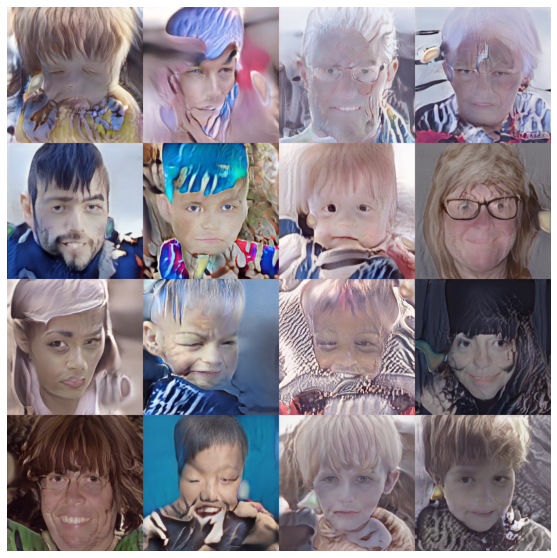

<Figure size 432x288 with 0 Axes>

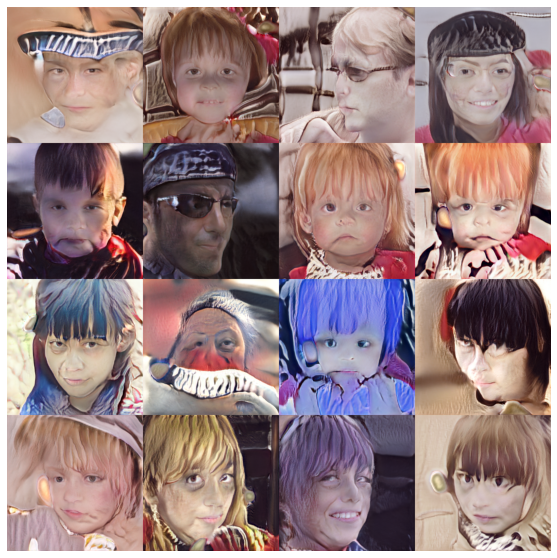

<Figure size 432x288 with 0 Axes>

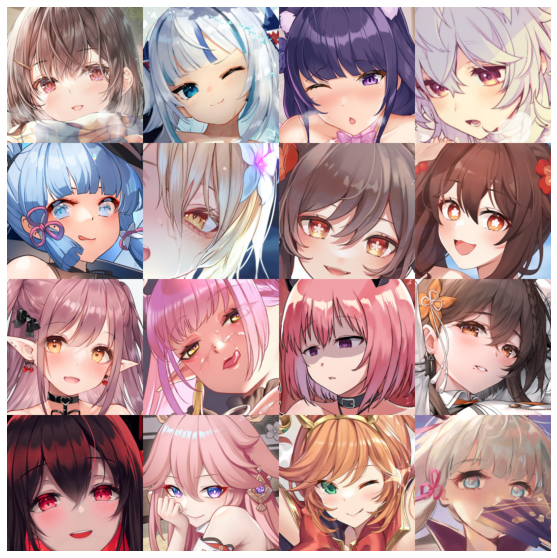

<Figure size 432x288 with 0 Axes>

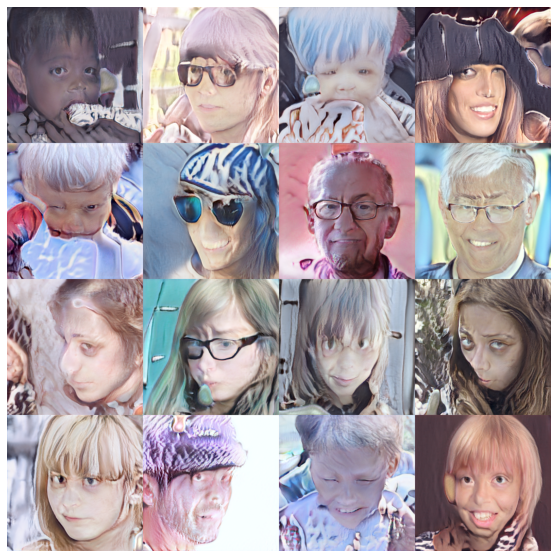

<Figure size 432x288 with 0 Axes>

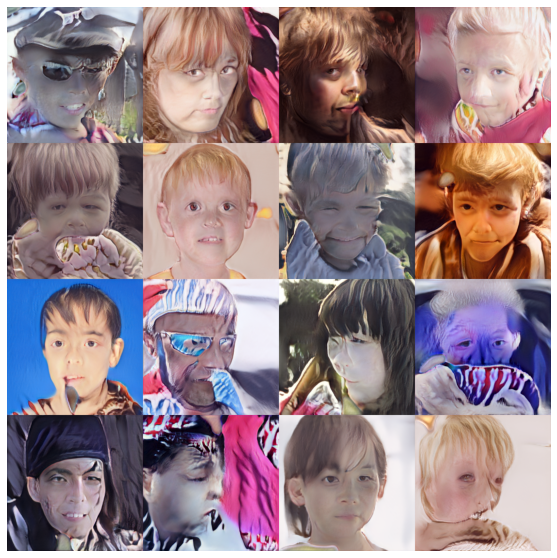

<Figure size 432x288 with 0 Axes>

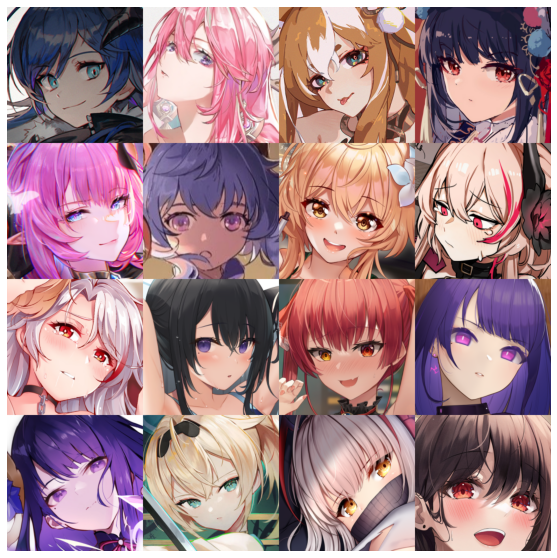

<Figure size 432x288 with 0 Axes>

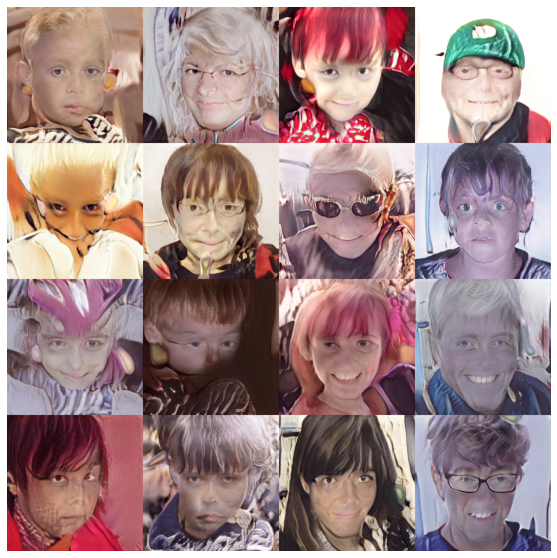

<Figure size 432x288 with 0 Axes>

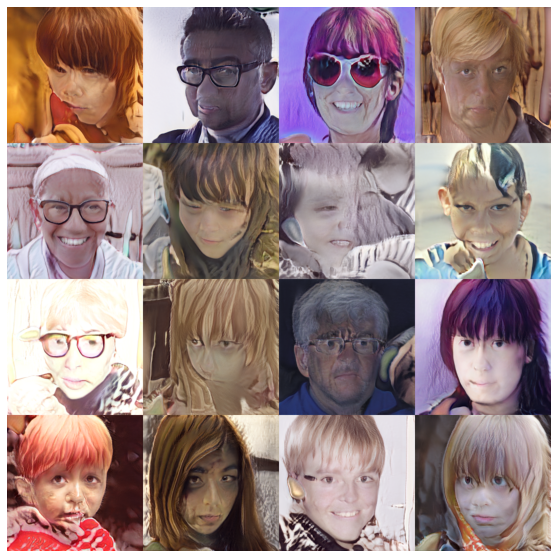

<Figure size 432x288 with 0 Axes>

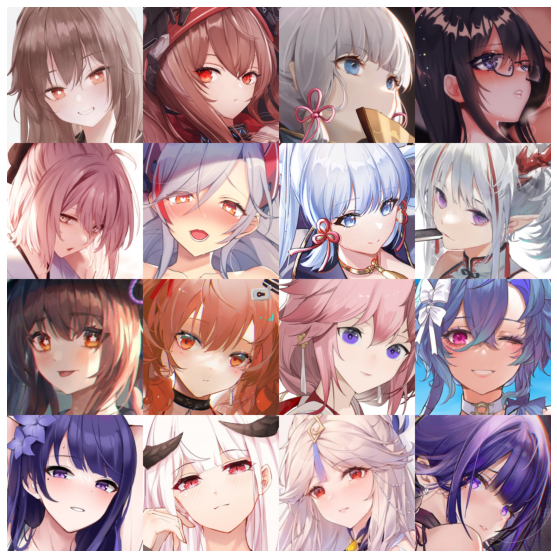

<Figure size 432x288 with 0 Axes>

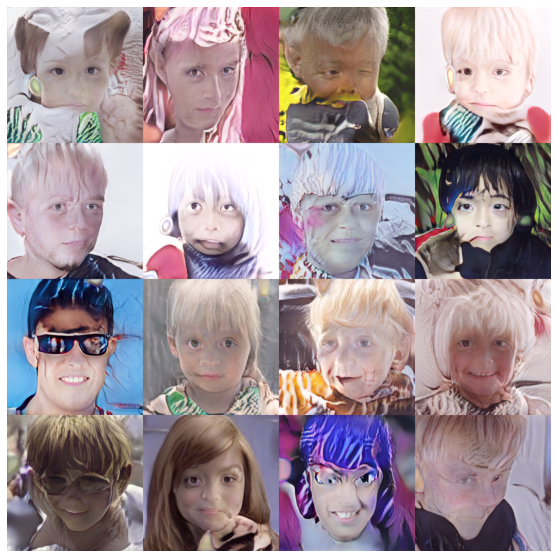

<Figure size 432x288 with 0 Axes>

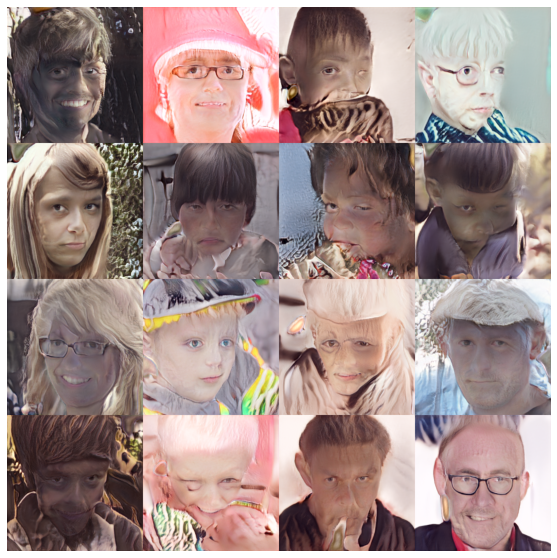

<Figure size 432x288 with 0 Axes>

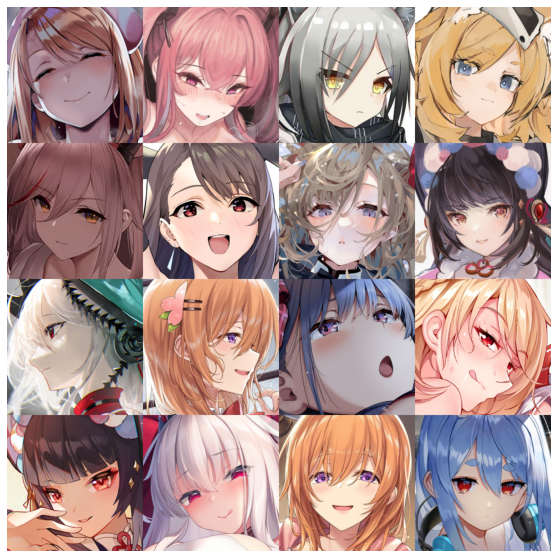

<Figure size 432x288 with 0 Axes>

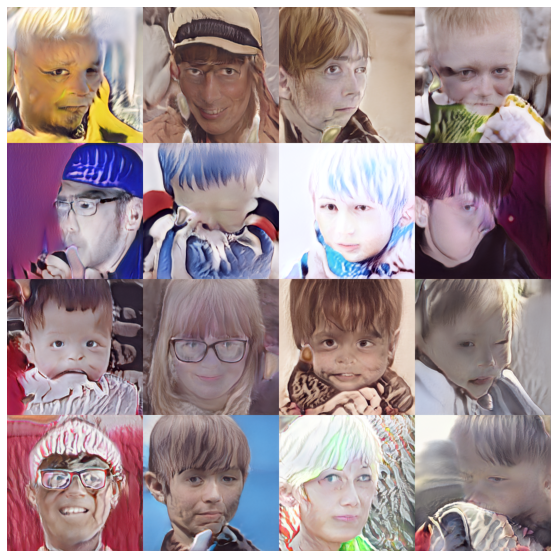

<Figure size 432x288 with 0 Axes>

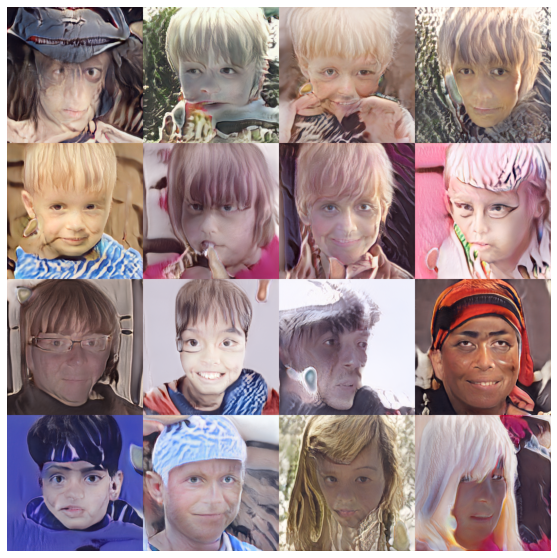

<Figure size 432x288 with 0 Axes>

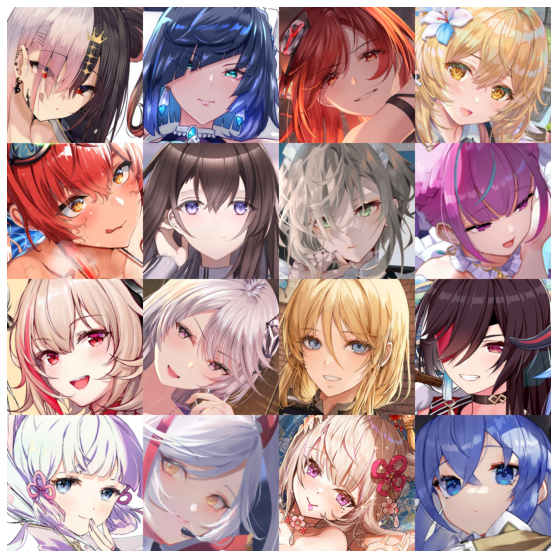

<Figure size 432x288 with 0 Axes>

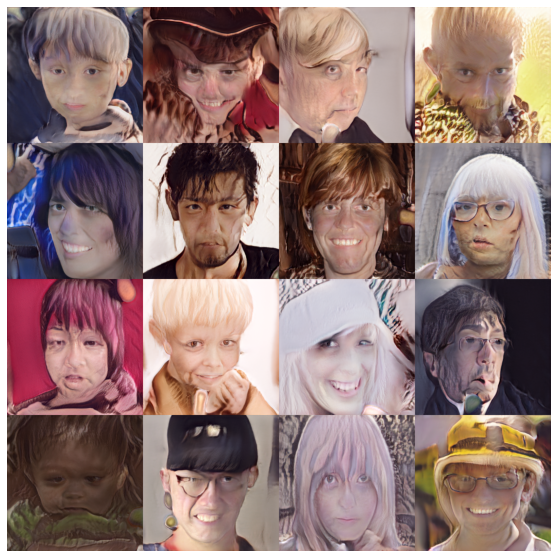

<Figure size 432x288 with 0 Axes>

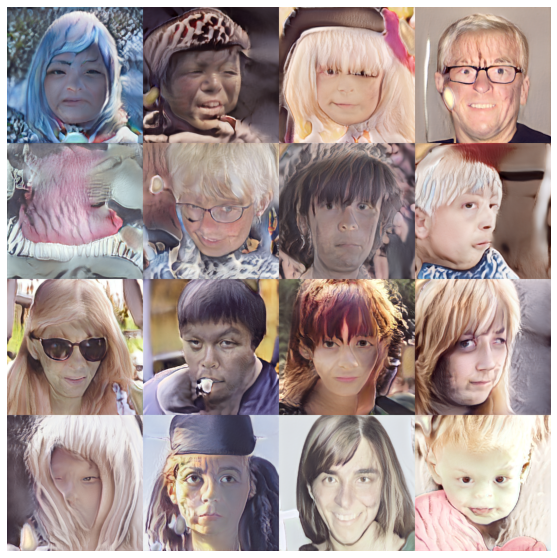

<Figure size 432x288 with 0 Axes>

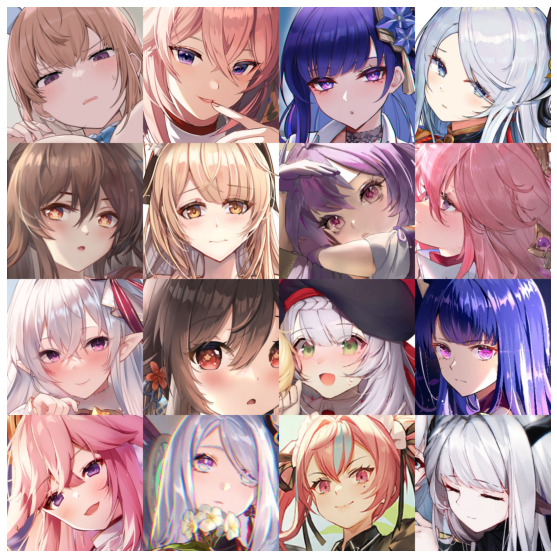

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=1200` reached.


<Figure size 432x288 with 0 Axes>

In [ ]:
trainer.fit(model=gan, train_dataloaders=dataloader)


# Inference

After you're happy with the quality of your FreezeD'd StyleGAN, you can run inference. Simply load the checkpoint from training and feed it some random noise to generate some cool anime faces!

In [ ]:
# Define some helper functions for inference
@torch.no_grad
def mean_style(generator, code_dim, device, batch=1024, batches=10):
    '''
    Function that computes the mean style vector.
    '''
    mean_style = []
    for i in range(batches):
        z = torch.randn(batch, code_dim).to(device)
        style = generator.mean_style(z)
        mean_style += [style]

    mean_style = torch.stack(mean_style, dim=0).mean(0)
    return mean_style

@torch.no_grad
def synthesize(generator, n_samples, code_dim, device):
    '''
    Function that samples random noise and generates a fake image.
    '''
    generator.eval()
    z = torch.randn(n_samples, code_dim, device=device)
    mean_style = mean_style(generator, code_dim, device)
    x = generator(z, step=step, alpha=1, mean_style=mean_style, style_weight=0.7)
    return x

In [ ]:
'''
n_samples = 16

# Load checkpoint
checkpoint = torch.load('stylegan-step=50000.pt')
generator = StyledGenerator(code_dim=code_dim).to(device)
generator.load_state_dict(checkpoint['generator'])

# Run inference
x = synthesize(generator, n_samples, code_dim, device)
show_tensor_images(x)
'''

# Further Work

This project leaves a lot of room for improvement. 

One possible improvement could be to use a newer version of StyleGAN. The StyleGAN used in this notebook is StyleGan v1 but currently the most recent version, StyelGan v3 is available. There have also been tutorials made by digital artists who have said StyleGAN2-ADA ([Github repository](https://github.com/NVlabs/stylegan2-ada-pytorch)) appears to fine-tune or train the fastest among all of the versions of StyleGAN currently available. 

It may also be better to run this experiement for longer. For example this experiement by a person using GANs for fashion ([blog link](https://shoprunnerblog.wordpress.com/2019/10/08/this-dress-doesnt-exist/)) spent 4 days training a model. The original notebook on FreezeD that inspired this experiemnt trained a model for 50,000 training steps. By comparison the current model has only trained for roughly 2,500 training steps. 

Furthermore, there are other methods of transfer learning for GANs. For example the original FreezeD paper contains comparisons to other methods of transfer learning. While some other methods of transfer learning appear to perform better there is often a tradeoff between performance and training time. Here is one example of an alternative transfer learning method that might be interesting to compare to FreezeD: [A cost-effective method for improving and re-purposing large, pre-trained GANs by fine-tuning their class-embeddings
](https://anhnguyen.me/project/biggan-am/)

There are also tuners and schedulers for PyTorch such as Ray-Tune or the PL fine-tune scheduler, however from personal experience it seems that changing the model architecture makes a larger impact than adjusting hyperparameters such as learning rates. 

# References

- [GAN course on coursera](https://www.coursera.org/specializations/generative-adversarial-networks-gans#courses)

## PL lightning tutorials / debugging tips: 
- https://www.pytorchlightning.ai/blog/3-simple-tricks-that-will-change-the-way-you-debug-pytorch
- [PyTorch Lightning for Dummies - A Tutorial and Overview
](https://www.assemblyai.com/blog/pytorch-lightning-for-dummies/)
- [Episode 3: From PyTorch to PyTorch Lightning
](https://www.youtube.com/watch?v=DbESHcCoWbM)
- [Finding why Pytorch Lightning made my training 4x slower.
](https://medium.com/@florian-ernst/finding-why-pytorch-lightning-made-my-training-4x-slower-ae64a4720bd1)
- [GAN PyTorch Lightning
](https://www.kaggle.com/code/harishvutukuri/gan-pytorch-lightning)
- https://github.com/Lightning-AI/lightning/issues/12398
